In [1]:
from IPython.core.display import HTML
# https://stackoverflow.com/questions/32156248/how-do-i-set-custom-css-for-my-ipython-ihaskell-jupyter-notebook
styles = open('./custom_css.css', "r").read()
s = '<style>%s</style>' % styles     
HTML(s)

<img src="../figures/external/title.png"
     alt="NYC MTA Turnstile Usage Dataset www.fontspace.com/category/speedy?p=2 Speedway by JLH Fonts"
     width="90%" height="30%"
     align="left"/>

<img src="../figures/external/title.png"
     alt="NYC MTA Turnstile Usage Dataset www.fontspace.com/category/speedy?p=2 Speedway by JLH Fonts"
     width="90%" height="40%"/>

# NYC MTA Turnstile Usage Dataset

<img src="../figures/external/crop.webp"
     loading="lazy"
     alt="NYC MTA Turnstiles"
     width="90%" height="40%"/>

# Table of contents

1. [Introduction](#Introduction)
    1. [Problem statement](#Problem-statement)
    1. [Data Source & Dataset](#Data-Source-&-Dataset)
    1. [Format & Columns](#Format-&-Columns)
    1. [Questions](#Questions)
    
1. [Methodology & pipeline](#Methodology-&-pipeline)
    1. [Executive summary](#Executive-summary)
    1. [Methodology](#Methodology)
        1. [Plan of work](#Plan-of-work)
        1. [Secondary sources](#Secondary-sources)
        1. [Dataset acceleration](#Dataset-acceleration)
    1. [Pipeline](#Pipeline)
        1. [Notes](#Notes)
        1. [Data cleaning](#Data-cleaning)
        1. [Feature engineering](#Feature-engineering)
    
1. [Load data & run preprocessing](#Load-data-&-run-preprocessing)
    1. ✨ Import modules
    2. ✨ Run processing

1. [Data Analysis and Visualization](#Data-Analysis-and-Visualization) - rewrite/restructure text
    1. 🔬 Data analysis 
    2. 📊 Visualization


[To table of contents](#Table-of-contents)
***

# Introduction

### Problem statement

* **We have** the data source and a few questions stated below
    * The core dataset we use is `NYC MTA Turnstile Usage Dataset` (link - [web.mta.info/developers/turnstile.html](http://web.mta.info/developers/turnstile.html))
    * Questions were asked by our `data users`
* **We need**
    * To **answer** questions using data processing techniques 
    * To **write** a reproducible, well-to-go pipeline 
    * To **prepare** continuously integrated set of charts, maps, visuals

[To table of contents](#Table-of-contents)

### Data Source & Dataset

**① Data source** is _Metropolitan Transportation Authority Web site_ [[link]](http://web.mta.info/developers/turnstile.html)

**② Dataset we use** is _NYC MTA Turnstile Usage Dataset_
> **NYC MTA Turnstile Usage Dataset**
>
> Have a look at / download the following dataset :
> - Go to http://web.mta.info/developers/turnstile.html
> - This dataset shows entry & exit counter values for each turnstile-device in each station in the NYC Subway System.
> - Note these aren’t counts per interval, but equivalent to an “odometer” reading for each device.

**🅐 Dataset stores** rough (_hardware audit level_) time-aggregates of **usage of gates in the `New York City subway system`**
* These numbers may be used as **a proxy metric to measure subway system usage by station**. 
    * So, chrono- and spatial- popularity of points of interest (i.e. shops, offices, attractions), dynamics of social mobility (i.e. working hours, touristic movements) are hidden there too

**③ Brief data description**
* **🅐 Dataset domain** is `transportation (mass public transit; Aviation, travel, and logistics)`
    * **Transport type** is `subway system`, in different parts of the world known as Underground, Metro, U-Bahn, Rapid transit, Heavy rail. 
        * See to get high-level understanding: 
            * Passenger rail terminology [[1]](https://en.wikipedia.org/wiki/Passenger_rail_terminology) 
            * American Public Transportation Association - Glossary of Transit Terminology, 1994 [[2]](https://www.apta.com/wp-content/uploads/Resources/resources/reportsandpublications/Documents/Transit_Glossary_1994.pdf)
            * Key operational metrics by International Association of Metros (Eastern Hemisphere) [[3]](http://www.asmetro.ru/upload/docs/2020.pdf)
            * List of metro systems [[4]](https://en.wikipedia.org/wiki/List_of_metro_systems)
            * List of metro (subway) maps [[5]](https://mapa-metro.com/en/)
            * Rapid transit [[6]](https://en.wikipedia.org/wiki/Rapid_transit)
    * **Transport location** is `New York metropolitan area`
* **🅑 Data license** (dataset use terms) is not noted on vendor's website
* **🅒 Provider** (responsible, curating entity) is the `Metropolitan Transportation Authority of NYC`.
    * Dataset is open, wide-known for a long time
    * Data is relatively raw & dirty. low-level aggregate abstraction

[To table of contents](#Table-of-contents)

### Format & Columns

① **Raw data** example is [here](http://web.mta.info/developers/resources/nyct/turnstile/ts_Field_Description_pre-10-18-2014.txt) (`ts_Field_Description_pre-10-18-2014.txt`):
    
> ```A002,R051,02-00-00,03-21-10,00:00:00,REGULAR,002670738,000917107,03-21-10,04:00:00,REGULAR,002670738,000917107,03-21-10,08:00:00,REGULAR,002670746,000917117,03-21-10,12:00:00,REGULAR,002670790,000917166,03-21-10,16:00:00,REGULAR,002670932,000917204,03-21-10,20:00:00,REGULAR,002671164,000917230,03-22-10,00:00:00,REGULAR,002671181,000917231,03-22-10,04:00:00,REGULAR,002671181,000917231```
>
> ```A002,R051,02-00-00,03-22-10,08:00:00,REGULAR,002671220,000917324,03-22-10,12:00:00,REGULAR,002671364,000917640,03-22-10,16:00:00,REGULAR,002671651,000917719,03-22-10,20:00:00,REGULAR,002672430,000917789,03-23-10,00:00:00,REGULAR,002672473,000917795,03-23-10,04:00:00,REGULAR,002672474,000917795,03-23-10,08:00:00,REGULAR,002672516,000917876,03-23-10,12:00:00,REGULAR,002672652,000917934```

② **Vendor's description of columns** is [here](http://web.mta.info/developers/resources/nyct/turnstile/ts_Field_Description_pre-10-18-2014.txt) (`ts_Field_Description_pre-10-18-2014.txt`):

> Field Description
>
> ```C/A,UNIT,SCP,
DATE1,TIME1,DESC1,ENTRIES1,EXITS1,DATE2,TIME2,DESC2,ENTRIES2,EXITS2,
DATE3,TIME3,DESC3,ENTRIES3,EXITS3,DATE4,TIME4,DESC4,ENTRIES4,EXITS4,
DATE5,TIME5,DESC5,ENTRIES5,EXITS5,DATE6,TIME6,DESC6,ENTRIES6,EXITS6,
DATE7,TIME7,DESC7,ENTRIES7,EXITS7,DATE8,TIME8,DESC8,ENTRIES8,EXITS8
>
> - C/A = Control Area (A002)
> - UNIT = Remote Unit for a station (R051)
> - SCP = Subunit Channel Position represents an specific address for a device (02-00-00)
> - DATEn = Represents the date (MM-DD-YY)
> - TIMEn = Represents the time (hh:mm:ss) for a scheduled audit event
> - DEScn = Represent the "REGULAR" scheduled audit event (occurs every 4 hours)
> - ENTRIESn = The comulative entry register value for a device
> - EXISTn = The cumulative exit register value for a device```
   
③ **"Standardized"* dataset** example:

   | UNIT   | C/A   | SCP       | DATE          | TIME      | DESC     	| ENTRIES   | EXITS	    |
   |------	|------	|----------	|------------	|----------	|---------	|-----------|-----------|
   | R051 	| A002 	| 02-00-00 	| 2013-01-02 	| 07:00:00 	| REGULAR 	| 3932819 	| 1355901 	|
   
* To standardize the data in order to ease further processing and comply actual (post-2014) dataset format
    * we transformed it from long-format (_one row = many audits, at max eight audits per row_) to high format (_one row = one audit_)
    * vendor did the same with `Current` (_after to 10/18/14_) observations

㊉ **Additional dataset example** (`Remote Unit/Control Area/Station Name Key`)

   |   Remote 	|   Booth 	|   Station      	|   Line Name 	|   Division 	|
   |----------	|---------	|----------------	|-------------	|------------	|
   |   R001   	|   A060  	|   WHITEHALL ST 	|   R1        	|   BMT      	|

* There was no description of this columns on vendor's web site

[To table of contents](#Table-of-contents)

### Questions
The list of questions is below.

> **🔬 Data analysis**:
> - Which station has the most number of units?
> - What is the total number of entries & exits across the subway system for February 1, 2013?
> - Let’s define the busy-ness as sum of entry & exit count. What station was the busiest on February 1, 2013? What turnstile was the busiest on that date?
> - What stations have seen the most usage growth/decline in 2013?
> - What dates are the least busy? Could you identify days on which stations were not operating at full capacity or closed entirely?
> - Bonus:  What hour is the busiest for station CANAL ST in Q1 2013?
>
> **📊 Visualization**:
> - Plot the daily row counts for data files in Q1 2013.
> - Plot the daily total number of entries & exits across the system for Q1 2013.
> - Plot the mean and standard deviation of the daily total number of entries & exits for each month in Q1 2013 for station 34 ST-PENN STA.
> - Plot 25/50/75 percentile of the daily total number of entries & exits for each month in Q1 2013 for station 34 ST-PENN STA.
> - Plot the daily number of closed stations and number of stations that were not operating at full capacity in Q1 2013.

Answers are in [[another chapter]](#Data-Analysis-and-Visualization)

[To table of contents](#Table-of-contents)
***

# Methodology & pipeline

### Executive summary

> _Left blank intentionally_

[To table of contents](#Table-of-contents)

## Methodology

| | |
|---|---|
|<img src="../figures/external/new-york-map.png" loading="lazy" alt="New York City map - urbanrail.net/am/nyrk/new-york.htm" width="400px" height="400px"/>|<img src="../figures/external/MTA-Subway-and-Bus-Maps.png.webp" loading="lazy" alt="MTA New York Subway and Bus Maps 2022 - newyork.co.uk/mta-new-york-subway-and-bus-maps/" width="415px" height="400px"/>|

> 🗺️ _Maps above are for illustrative and for informational purposes only_

[To table of contents](#Table-of-contents)

### Plan of work

① **We need**
* To **answer** questions using data processing techniques 
* To **write** a reproducible, well-to-go pipeline 
* To **prepare** continuously integrated set of charts, maps, visuals

② **We will**
* **Research** provided documentation, check secondary and auxiliary sources
* **Describe** steps of processing pipeline
    * Assumptions & gimmick 
    * Dataset cleaning 
    * Feature generation 
    * Prepare scripts
* **Provide** an analysis of the dataset itself, inc. answers, conclusions, and observations

㊉ **We assume**
* **No interpolation** (resampling), for now
    * Audit events have different frequencies
    * Audit events have many event codes with no clear documentation
* **No additional features** (effects, adjustments), for now
    * Weather (temperature, precipitations, anomalies, like storms and floods)
    * Attraction points (educational, like K-12, pre-schools, universities; social and medical, like hospitals; commercial, like malls or offices of big companies; sport, like stadiums; transportation, like hubs and connections)
    * Rush hours, holidays, seasonality
* **Freeridership exists and describes** the numerical difference between exits and entries volumes

[To table of contents](#Table-of-contents)

### Secondary sources

① **What do we have?**
* **Dataset which combines geospatial and lateral features**
    * observations from real word distributed by locations and over time
* **Dataset is well-known**, 
    * We have chances to refer to other works, and sources, including ones that relate semantically (i.e. taxi datasets or mass public transportation in general)


② **Sources**

* Legend: 🚇 - subway, 🚕  - taxi, ✰ - highlighted work 

1. **Use of data**
    1. 🚇 [Taming the MTA’s Unruly Turnstile Data by Chris Whong](https://medium.com/qri-io/taming-the-mtas-unruly-turnstile-data-c945f5f96ba0)
    1. ✰ 🚇 [MTA TURNSTILE DATA by mango314](https://github.com/mango314/mta)
    1. 🚇 [MTA Turnstile Data by Avi G](https://asgrunwald.github.io/MTA-Turnstile-Data/)
    1. 🚇 [Subway Turnstile Data & Understanding NYC Travel Patterns by Sean Andrew Chen](https://seanandrewchen.com/portfolio/nyc-subway-turnstile-data/)
    1. ✰ 🚇 [Exploring MTA Turnstile Data by Andrew Auyeung](https://andrew-k-auyeung.medium.com/exploring-mta-turnstile-data-b22026cf9433)
    1. ✰ 🚕 [Reverse Engineering Uber and Lyft Surge Pricing in Chicago by Todd W. Schneider](https://toddwschneider.com/posts/chicago-ridehail-surge-pricing/)
    1. ✰ 🚇 [Meeting Women Where They Are by Nina Sweeney](https://towardsdatascience.com/meeting-women-where-they-are-3735b0bd362d)
    1. ✰ 🚕 [Analyze the NYC Taxi Data by Chih-Ling Hsu](https://chih-ling-hsu.github.io/2018/05/14/NYC) 
    1. 🚕 [TLC FastDash by NYC Taxi & Limousine Commission](https://tlcanalytics.shinyapps.io/tlc_fast_dash/)
    1. 🚇 [Kaggle MTA Turnstiles dataset & kernels](https://www.kaggle.com/new-york-state/nys-turnstile-usage-data/code)
        1. [MTA Turnstile Data Analysis, Kaggle Notebook by Yuqi N](https://www.kaggle.com/nieyuqi/mta-turnstile-data-analysis)
    1. [[New York’s Growing Free-Rider Problem]](https://www.city-journal.org/mta-farebeating)
    
1. **Visualisations**
    1. ✰ 🚇 [NYC Subway Ridership dashboard by Sunny Ng](https://www.subwayridership.nyc/)
    1. ✰ 🚇 [NYC Subway Usage calendar heatmap by Aaron Schumache](http://bl.ocks.org/ajschumacher/5127001)
    1. ✰ 🚇 [Standing Room Only - MTA Morning Commuters by Diane Ferrera](https://dianeferrera.com/data-mta.html)
    1. 🚇 [Passenger intensity of Tashkent Metro by Khurshid Suyunov](https://www.youtube.com/watch?v=mElRm9LiwM0)
    1. 🚕 [Visualizing Taxi Network pinterest collection by Kristen Sosulski](https://www.pinterest.com/kristensosulski/visualizing-taxi-network/)
    1. [Road Infrastructure research, Disaster Resilience in Bangladesh by Leonardo Nicoletti](https://www.leonardonicoletti.com/work/bangladeshvul)
    1. [Paper, Sankey Arcs - Visualizing edge weights in path graphs by MIT Senseable City Lab](http://senseable.mit.edu/papers/pdf/20120605_Nagel_etal_SankeyArcs_Eurographics.pdf)
    1. ✰ 🚕 [Where do people go in NYC? — The recipe of an analysis by Alexina Coullandreau, taxi graph research](https://medium.com/@mozart38/where-do-people-go-in-nyc-the-recipe-of-an-analysis-a307499013a6)
    1. [Using GeoPy to Filter MTA Subway Stations by Christopher Franzini, basic map use](https://cjfranzini.github.io/geopy-and-MTA/)
    
1. **This task is already done**
    1. ✰ 🚇 [MTA package by Data Clinic @ Two Sigma](https://github.com/tsdataclinic/mta/blob/master/src/turnstile/turnstile.py)
        1. [Commuting during COVID-19: Using Open Data to Predict NYC Subway Crowds by Two Sigma](https://medium.com/dataclinic/commuting-during-covid-19-using-open-data-to-predict-nyc-subway-crowds-f1dcabc4fd99)
    1. 🚇 [MTA Data Challenge by yh2693](http://www.columbia.edu/~yh2693/MTA_data.html)

[To table of contents](#Table-of-contents)

### Dataset acceleration

We estimated five (5) main streams, "industries", areas where dataset might be utilized
1. 🏛️ **"Social good"** (advice to municipalities, local councils, NCO/NGOs, including _pro bono_ work) 
1. 📰 **"News and mass communication media"** (public relationship, data-inspired journalism)
1. 🏢 **"Real estate"** (optimization & estimation of commercial real estate, its' advertisement, better allocation, and support of newer development)
1. 📡 **"Telecommunication networks"** ("Telecommunication networks" (optimization of network and its' services quality, availability on-station, in-metro cars)

1. 💺 **"Transit allocation"** (optimize rolling stock volumes, between-trains intervals, staff personnel over daytime; optimize volumes of buses, trams, taxis around a block)

[To table of contents](#Table-of-contents)
***

## Pipeline

|   |
|---|
|<img src="../figures/external/pipline.png" alt="Scheme of pipline. Tool - excalidraw.com" width="100%" height="50%">|

> 👷 _Scheme describes core steps - ingestion (extraction), preprocessing (cleaning, feature generation), analytical reporting (notes, charts)_

[To table of contents](#Table-of-contents)

### Notes

1. Some `C/A (Booth) - UNIT (Remote)` pairs can not be mapped using provided file
    * F.e, `A049 - R088` or `R612 - R057` - do not exist in a mapping book
    * Let assign them `NA`
2. Cumulative `ENTRIES` and `EXITS` have
    * _*outliers*_
    * _*points with unexpected behavior*_
        * F.e., there are negative values and values significantly larger or smaller than other values
        * Because of limited time, let us just remove all audits where ENTRIES and EXITS volumes are `negative` out of [25%, 95%] percentiles for the whole dataset
3. Many audits, `despite the REGULAR desc code` occurred out of 4 hours frequency rule
    * There were additional _"REGULAR"_ audits in a 4-hour window (no different audits in between), 
    * There were audits less frequent than 4-hours
    * See selected example below:
    | UNIT  | C/A   | SCP       | DATE          | TIME          | DESC     	|           |           |
    |------	|------	|----------	|------------	|-------------	|---------	|-----------|-----------|
    | R051 	| A002 	| 02-00-00 	| 2013-01-02 	| 07:00:00 	    | REGULAR 	| 3932819 	| 1355901 	|
    | R051 	| A002 	| 02-00-00 	| 2013-01-02 	| **10:50:00** 	| REGULAR 	| 3932983 	| 1356198 	|
    | R051 	| A002 	| 02-00-00 	| 2013-01-02 	| **10:51:08** 	| REGULAR 	| 3932984 	| 1356198 	|
    | R051 	| A002 	| 02-00-00 	| 2013-01-02 	| **10:52:48** 	| REGULAR 	| 3932984 	| 1356202 	|
    | R051 	| A002 	| 02-00-00 	| 2013-01-02 	| 11:00:00 	    | REGULAR 	| 3932988 	| 1356211 	|


[To table of contents](#Table-of-contents)

### Data cleaning

Usually, **data cleaning is the most expert-oriented** stage of work. 

* **Questions we ask**:
    1. **What to do?**
        * Answers: Remove (what?), Fill (how?), Assign a missing (where?)
    1. **What abstraction level?**
        * Answers: UNIT-C/A-SCP triplet? Station? Time interval? Row (Audit)? All Dates?
    
* 🧹 **Cleaning**:
    1. **Merge station names**, map C/A (Booth) - UNIT (Remote)
        1. Otherwise, assign NA
    1. **Variety of DESC codes** - stay _as is_
        1. Note, that some codes sound intuitive
            * F.e. DOOR CLOSE might presume people didn't use a turnstile and used other gates, emergency exit
    1. **Limit EXIT and ENTRY volumes** from 0 to 10,000, inclusive 
        1. Otherwise, assign NA

[To table of contents](#Table-of-contents)

### Feature engineering


Traditionally, **feature engineering has no limits but imagination** - especially when interpretation does not matter. 

✔️ However, the current **task is pretty defined**, as well as **interpretation matters** here

So, **we will**
1. **Merge station-related information**
    1. Add fields from the `Remote Unit/Control Area/Station Name Key` file, map with `C/A - UNIT` pairs
    1. Add geospatial coordinates of stations from `previously geocoded open-sourced file`, map with station name
    
1. **Extend DESC codes and TURNSTILE features**
    1. Add binary feature for `regular and all except regular` DESC codes
    1. Merge `C/A with UNIT with SCP` as TURNSTILE identification

1. **Extract basic date & time features** from DATE-TIME fields
    1. Extract year, month, and day of the week from the `DATE` field 
    1. Extract hour, minute from the `TIME` field
    1. For now, we will not add holidays, special events
    
1. **Process odometer-like readings** of `ENTRIES` and `EXITS`
    1. Calculate "net" exit and entry numbers from cumulative `ENTRIES` and `EXITS` volumes
        1. consider 'realism' limitations (see: data cleaning)

[To table of contents](#Table-of-contents)
***

<img src="../figures/external/venn-triangles-back.png"
     alt="Venn Triangles placeholder"
     width="100%" height="10%"/>

# Load data & run preprocessing

① Let's **import modules** we need for analysis
* Build-in packages
* Third-party packages
* Custom scripts

In [2]:
import sys; sys.path.insert(0, '..')
img_num = 1 # constant to enumerate figures
main_title_dict_style = dict(backgroundcolor='#009aa6', color='white', size=12, weight='bold',
                            horizontalalignment='left')

import pandas as pd
import numpy as np
import warnings; warnings.simplefilter(action='ignore', category=FutureWarning)
import matplotlib.pyplot as plt; plt.rcParams['figure.facecolor'] = 'white'
import plotly.express as px
#!pip install PtitPrince
import ptitprince as pt
import seaborn as sns

import src.get_data as get_data
import src.feature_generation as feature_generation 
import src.visualisations as visuals_prepared

import importlib
importlib.reload(get_data); importlib.reload(feature_generation); importlib.reload(visuals_prepared);

② Let's **run the initial processing** pipeline
* to load
* to transform into a proper format 
* to clean data and engineer features


✔️ **Local storage** is intuitive & its' structure follows **DS Cookiecutter** standard [[link]](https://drivendata.github.io/cookiecutter-data-science/#directory-structure):
> ``` 
├── data
│   ├── external       <- Data from third party sources.
│   ├── interim        <- Intermediate data that has been transformed.
│   ├── processed      <- The final, canonical data sets for modeling.
│   └── raw            <- The original, immutable data dump.
```

In [3]:
%%time
RUN_FROM_RAW_DATA = False

RUN_FROM_FEATURE_ENG = False

if RUN_FROM_RAW_DATA: 
    # Access and load data. Then make it in one analytical format 
    links = get_data._get_links_to_raw_data()
    raw_files = get_data.download_raw_data(links, download=False)
    assert len(links) == len(raw_files)
    long_files = get_data.reorganize_raw_files(raw_files, custom=False)
    assert len(raw_files) == len(long_files) 
    _ = get_data._concat_files(long_files, save_path='../data/interim/turnstile_concated_long.csv')

if RUN_FROM_FEATURE_ENG: 
    # Preprocess data
    df = pd.read_csv('../data/interim/turnstile_concated_long.csv', index_col=0)
    # By data update format, to get all Q1 2013 dates we need raw files with last dates of Q4 2012 - clean it.
    df = df[~(df.DATE.str.contains('-12$') | (df.DATE.str.contains('^04-')))]
    
    # Feature generation
    # 1. Decode known C/A (Booth) - Unit (Remote) pairs to add stations; also add coordinates
    #    add stations using C/A and UNIT using mapping table
    df = feature_generation.add_stations(df=df, 
                                         path_to_stations_data='../data/external/Remote-Booth-Station.csv')
    df.to_csv('../data/interim/data_with_stations.csv')
    #    add geocoded coordinates to stations using mapping table
    df = feature_generation.add_coordinates(df=df, 
                                            path_to_stations_coords='../data/external/geocoded.csv')
    df.to_csv('../data/interim/data_with_stations_with_coords.csv')
    
    # 2. Add binary feature for regular or all except regular DESCs
    df['DESC_CATEGORY'] = df.DESC.where(cond=df.DESC == 'REGULAR', other='OTHER')
    # 3. Add feature to ideitify unique devise of turnstile with known triplet of CA, Remote, SCP
    df['TURNSTILE_ID'] = df['C/A'] + " " + df['UNIT'] + " " + df['SCP']
    
    # 4. Generate time features
    df = feature_generation.calc_features_from_datetime(df)
    
    # 5. Process odometer-like (cumulative) readings for entry and exit
    df = df.sort_values(['C/A','UNIT','SCP', 'AUDIT_DATE_TIME']).reset_index(drop=True)
    df = feature_generation.calc_features_from_cumulative_records(df)
    
    # 6. Save ready-to-analytics processed file with all extra features
    df.to_csv('../data/processed/data_processed.csv', index=False)
    
df = pd.read_csv('../data/processed/data_processed.csv',
                parse_dates=['AUDIT_DATE_TIME'])

/opt/homebrew/lib/python3.9/site-packages/IPython/core/magics/execution.py:1321: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code, glob, local_ns)


CPU times: user 3.25 s, sys: 601 ms, total: 3.85 s
Wall time: 4.29 s


③ Let's see what **columns and data types** we have **after preprocessing**

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2831539 entries, 0 to 2831538
Data columns (total 26 columns):
 #   Column           Dtype         
---  ------           -----         
 0   row              int64         
 1   UNIT             object        
 2   C/A              object        
 3   SCP              object        
 4   DATE             object        
 5   TIME             object        
 6   DESC             object        
 7   ENTRIES          float64       
 8   EXITS            float64       
 9   Station          object        
 10  Line Name        object        
 11  Division         object        
 12  Lat              float64       
 13  Lon              float64       
 14  DESC_CATEGORY    object        
 15  TURNSTILE_ID     object        
 16  AUDIT_DATE_TIME  datetime64[ns]
 17  AUDIT_YEAR       int64         
 18  AUDIT_MONTH      int64         
 19  AUDIT_WEEK       int64         
 20  AUDIT_DOW        int64         
 21  AUDIT_HOUR       int64         

In [5]:
df.head(3)

,row,UNIT,C/A,SCP,DATE,TIME,DESC,ENTRIES,EXITS,Station,...,AUDIT_DATE_TIME,AUDIT_YEAR,AUDIT_MONTH,AUDIT_WEEK,AUDIT_DOW,AUDIT_HOUR,AUDIT_MINUTE,ENTRIES_DIFF,EXITS_DIFF,BUSYNESS
0,3,R051,A002,02-00-00,01-01-13,03:00:00,REGULAR,3932284.0,1355714.0,LEXINGTON AVE,...,2013-01-01 03:00:00,2013,1,1,1,3,0,NaN,NaN,NaN
1,4,R051,A002,02-00-00,01-01-13,07:00:00,REGULAR,3932299.0,1355721.0,LEXINGTON AVE,...,2013-01-01 07:00:00,2013,1,1,1,7,0,15.0,7.0,22.0
2,5,R051,A002,02-00-00,01-01-13,11:00:00,REGULAR,3932327.0,1355774.0,LEXINGTON AVE,...,2013-01-01 11:00:00,2013,1,1,1,11,0,28.0,53.0,81.0


[To table of contents](#Table-of-contents)
***

<img src="../figures/external/venn-triangles-back.png"
     alt="Venn Triangles placeholder"
     width="100%" height="10%"/>

# Data Analysis and Visualization

We have two groups of questions.

**🔬 Data analysis**
1. [Which station has the most number of units?](#DA1)
1. [What is the total number of entries & exits across the subway system for February 1, 2013?](#DA2)
1. [Let’s define the busy-ness as sum of entry & exit count](#DA3)
    1. What station was the busiest on February 1, 2013?
    1. What turnstile was the busiest on that date?
1. [What stations have seen the most usage growth/decline in 2013?](#DA4)
1. [What dates are the least busy?](#DA5) 
    1. Could you identify days on which stations were not operating at full capacity or closed entirely?
1. [Bonus:  What hour is the busiest for station CANAL ST in Q1 2013?](#DA6)
    
**📊 Visualization**
1. [Plot the daily row counts for data files in Q1 2013.](#VIZ1)
1. [Plot the daily total number of entries & exits across the system for Q1 2013.](#VIZ2)
1. [Plot the mean and standard deviation of the daily total number of entries & exits for each month in Q1 2013 for station 34 ST-PENN STA.](#VIZ3)
1. [Plot 25/50/75 percentile of the daily total number of entries & exits for each month in Q1 2013 for station 34 ST-PENN STA.](#VIZ4)
1. [Plot the daily number of closed stations and number of stations that were not operating at full capacity in Q1 2013.](#VIZ5)
    1. Daily Number of closed stations
    1. Daily Number of stations that were not operating at full capacity

Let's answer these questions using our data.

[To table of contents](#Table-of-contents)

### DA1

* **Question**: - Which station has the most number of units?
* **Answer**: 
    1. We see, there are **two stations with the most 'units' (5 units) in our dataset** - `86 ST` and `CANAL ST`
* **Notes / remarks**:
    1. This's an easy & intuitive question, but we might request a formal definition of a 'unit' and 'station' here.
    1. We might just use a file with `booth -to- remote units -to- station` mapping, [Remote-Booth-Station.xls file](http://web.mta.info/developers/resources/nyct/turnstile/Remote-Booth-Station.xls), to answer this question
    1. Some duplets of `Remote Unit/Control Area` from _an empiric dataset_ were not presented in _mapping file_ 

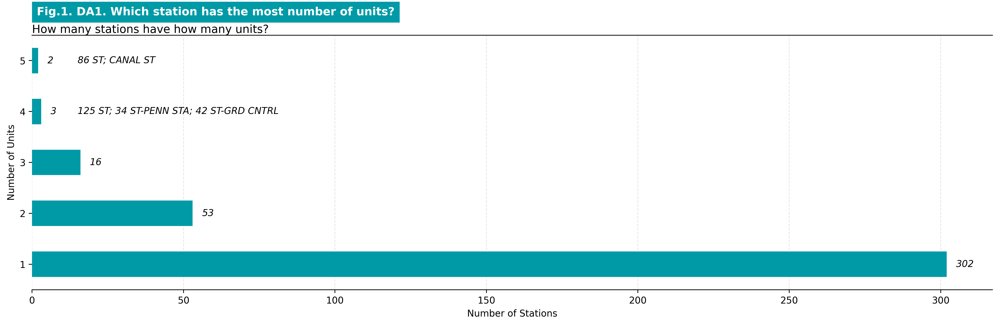

Station
86 ST              5
CANAL ST           5
125 ST             4
34 ST-PENN STA     4
42 ST-GRD CNTRL    4
Name: UNIT, dtype: int64

In [6]:
df_aux = df.groupby('Station').UNIT.nunique()

fig, axes = plt.subplots(1, 1, figsize=(15, 5), dpi=350)
_ = visuals_prepared.plot_bar_chart_units_per_stations(df_aux, axes)

title = f'Fig.{img_num}. DA1. Which station has the most number of units?'
fig.suptitle(t=title, x=0.04, y=0.96, **main_title_dict_style); img_num += 1
axes.spines['top'].set_visible(True)

fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])
plt.show()
display(df.groupby('Station').UNIT.nunique().nlargest(5))

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### VIZ1

* **Question**: - Plot the daily row counts for data files in Q1 2013.
* **Answer**: 
    1. We see the daily row counts for data files in Q1 2013, considering the next remarks
* **Notes / remarks**:
    1. We defined `row counts` as `the number of audit quintets` (groups of five columns that describe every audit event) that we have _after data transformations, preprocessing, and cleaning_
    1. In addition, we plotted a split by `REGULAR` and `not REGULAR` audit description code
        * For further plots, we use all description codes - there were no major differences in their behavior
    1. On the other hand, we might add this to every incoming part of data as data quality and logging stage

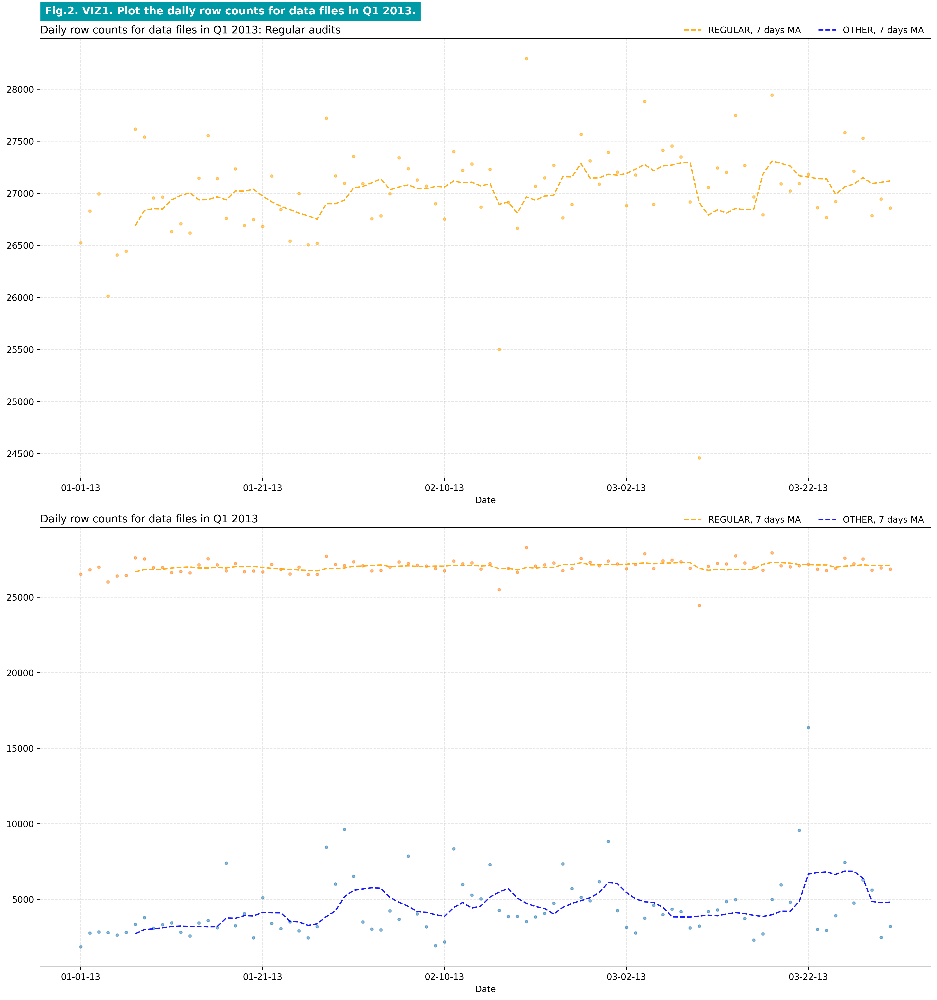

In [7]:
df_aux = df.groupby(['DATE', 'DESC_CATEGORY']).row.count().unstack(1)

fig, axes = plt.subplots(2, 1, figsize=(15, 16), dpi=350)
axes = axes.flatten()

df_aux.REGULAR.plot.line(style='.', ax=axes[0], color=['orange'], alpha=0.5, zorder=10, label='regular scatter')
df_aux.REGULAR.rolling(7).mean().plot.line(style='--', ax=axes[0], color=['orange'], label='regular weekly mean',
                                   alpha=0.9, zorder=10)

df_aux.plot.line(style='.', ax=axes[1], alpha=0.5, zorder=10, label='both scatter')
df_aux.rolling(7).mean().plot.line(style='--', ax=axes[1], color=['blue', 'orange'], label='both weekly mean',
                                   alpha=0.9, zorder=10)

for indx in range(len(axes)):
    axes[indx].grid(axis='both', alpha=0.20, c='gray', linestyle='--', zorder=0)
    axes[indx].set(xlabel='Date'); axes[indx].set(xlabel='Date')
    axis_title = 'Daily row counts for data files in Q1 2013'
    axes[indx].set_title(axis_title + ': Regular audits' if indx % 2 == 0 else axis_title, loc='left')
    axes[indx].spines[['left', 'right']].set_visible(False); axes[indx].spines[['top']].set_visible(True)
    axes[indx].legend().remove()

#fig.legend(bbox_to_anchor=[0.53, 0.975], loc='upper left', frameon=False, labelspacing=0.1,
            #labels=['REGULAR', 'OTHER', 'OTHER 7 day MA', 'REGULAR 7 day MA']
#          ) # ncol=4, 

handles, labels = fig.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles)) # # reversed(by_label.keys())
legend1 = fig.legend(handles=reversed(by_label.values()), labels=['REGULAR, 7 days MA', 'OTHER, 7 days MA'], 
                    ncol=7, loc='upper left', bbox_to_anchor=(0.72, 0.978), frameon=False)
legend2 = fig.legend(handles=reversed(by_label.values()), labels=['REGULAR, 7 days MA', 'OTHER, 7 days MA'], 
                    ncol=7, loc='upper left', bbox_to_anchor=(0.72, 0.492), frameon=False)

title = f'Fig.{img_num}. VIZ1. Plot the daily row counts for data files in Q1 2013.'
fig.suptitle(t=title, x=0.051, y=0.99, **main_title_dict_style); img_num += 1

fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)

### DA2

* **Question**: - What is the total number of entries & exits across the subway system for February 1, 2013?
* **Answer**: 
    1. * We see **the total number of entries and exits** for Feb 1, 2013 for whole subway system, considering next remarks
        * Numbers are pretty realistic, we might refer to actual MTA usage reports [[link](https://new.mta.info/coronavirus/ridership)] and historical MTA reports [[link](http://web.mta.info/nyct/facts/ridership/ridership_sub_annual.htm)]
* **Notes / remarks**:
    1. Because we defined _hourly_ values in rather rough manner, it caused a pretty raw definition of _daily_ values too.
        * I.e., if the last audit today were at 22:00 and the first audit tomorrow was at 02:00, we added in-between EXITS and ENTRIES to tomorrow'. We **didn't resample or interpolate values for all interim hours, minutes**
            * On the other hand, there were works that used the interpolation approach already. See `Two Sigma Data Clinic MTA project for reference` [[link]](https://github.com/tsdataclinic/mta/blob/master/src/turnstile/turnstile.py#L41).
    1. Chart idea credits to Diane Ferrera's work - MTA Morning Commuters [[link]](https://dianeferrera.com/data-mta.html)

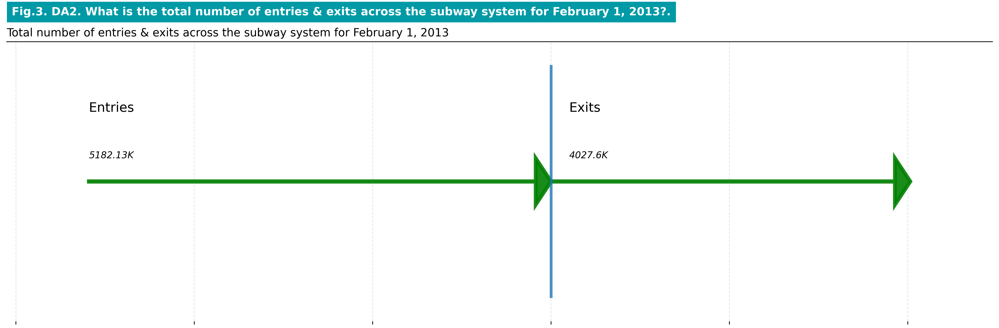

ENTRIES_DIFF    5182130.0
EXITS_DIFF      4027600.0
BUSYNESS        9209730.0
Name: 01-02-13, dtype: float64

In [8]:
df_aux = df.groupby('DATE')[['ENTRIES_DIFF', 'EXITS_DIFF', 'BUSYNESS']].sum().loc['01-02-13']

fig, axes = plt.subplots(1, 1, figsize=(15, 5), dpi=350)

_ = visuals_prepared.plot_one_line_entry_exit_chart(entries=df_aux['ENTRIES_DIFF'], 
                                                    exits=df_aux['EXITS_DIFF'], 
                                                    y=1, axis=axes)

title = f'Fig.{img_num}. DA2. What is the total number of entries & \
exits across the subway system for February 1, 2013?.'
fig.suptitle(t=title, x=0.015, y=0.97, **main_title_dict_style); img_num += 1
axes.spines[['top']].set_visible(True)
fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])
plt.show()
display(df_aux)

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### VIZ2

* **Question**: - Plot the daily total number of entries & exits across the system for Q1 2013.
* **Answer**: 
    1. We see the **daily total number of entries & exits** across the system for Q1 2013
    1. We see,
        * **Weekly seasonality** - end of the week metro is less populous. It's an interesting observation.
        * **Difference between `ENTRIES` and `EXITS`** is pretty high. However, the vast majority of sources that work with this dataset explain this with either use of emergency exit doors or systematically mismatched counters. So, let's know it.
* **Notes / remarks**:
    1. We used an interactive (dynamic, clickable) chart here because this way is easier and faster to visualize series with long time-range and multi categories

In [9]:
df_aux = df.groupby('DATE')[['ENTRIES_DIFF', 'EXITS_DIFF']].sum()#['ENTRIES_DIFF'].reset_index()
df_aux.index = pd.to_datetime(df_aux.index)

title = f"Fig.{img_num}. VIZ2. Daily total number of entries & exits across the system for Q1 2013"; img_num += 1
yaxis_label = "Total number"
xaxis_label = "Date"

visuals_prepared.plot_interactive_line_or_bar(df_aux, title, yaxis_label, xaxis_label, lineplot=True)

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### DA3

* **Question**: - Let’s define the busy-ness as sum of entry & exit count. What station was the busiest on February 1, 2013? What turnstile was the busiest on that date?
* **Answer**: 
    1. We see, 
        * **the busiest station was `34 ST-PENN STA`**, 
        * **the busiest turnstile at this station was `R138 R293 00-00-02`**
* **Notes / remarks**:
    * We defined `turnstile` as a concatenated string of `C/A-UNIT-SCP` (maybe, a unique specific device, i.e. one tripod gate). Some people use just `C/A-UNIT` (maybe, a group of "devices", i.e. group of tripod gates).
    * There was no specification whether asked to use `turnstile in general` or `turnstile from the first part of the question, What station was the busiest on February 1, 2013?`. We used the second case - for the busiest station.

> **_Subquestion 1:_** What station was the busiest on February 1, 2013?

In [10]:
df.groupby(['DATE', 'Station'])[['ENTRIES_DIFF', 'EXITS_DIFF', 'BUSYNESS']].sum().loc['01-02-13'].\
        sort_values(['BUSYNESS'], ascending=False).head(10)

,ENTRIES_DIFF,EXITS_DIFF,BUSYNESS
Station,,,
34 ST-PENN STA,171756.0,146333.0,318089.0
42 ST-GRD CNTRL,142018.0,137934.0,279952.0
34 ST-HERALD SQ,120737.0,111778.0,232515.0
42 ST-TIMES SQ,100051.0,92818.0,192869.0
86 ST,101287.0,90768.0,192055.0
14 ST-UNION SQ,90693.0,91286.0,181979.0
42 ST-PA BUS TE,98037.0,77367.0,175404.0
47-50 ST-ROCK,63451.0,63226.0,126677.0
125 ST,70371.0,54321.0,124692.0


> **_Subquestion 2:_** What turnstile was the busiest on that date?

In [11]:
df[(df.Station == '34 ST-PENN STA') & (df.DATE == '01-02-13')]\
    .groupby(['TURNSTILE_ID', 'Station']).BUSYNESS.sum().sort_values(ascending=False)

TURNSTILE_ID        Station       
R138 R293 00-00-02  34 ST-PENN STA    7306.0
R138 R293 00-00-03  34 ST-PENN STA    7262.0
R138 R293 00-03-06  34 ST-PENN STA    7021.0
R138 R293 00-00-00  34 ST-PENN STA    6776.0
R138 R293 00-00-01  34 ST-PENN STA    6644.0
                                       ...  
N067 R012 00-06-02  34 ST-PENN STA       2.0
N067 R012 00-06-03  34 ST-PENN STA       0.0
R138 R293 00-05-01  34 ST-PENN STA       0.0
N070 R012 04-05-00  34 ST-PENN STA       0.0
N070 R012 04-05-01  34 ST-PENN STA       0.0
Name: BUSYNESS, Length: 100, dtype: float64

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### VIZ3

* **Question**: - Plot the _mean and standard deviation_ of the daily total number of entries & exits for each month in Q1 2013 for station 34 ST-PENN STA.
* **Answer**: 
    1. We see the **chart that illustrates statistics (quantiles) of the daily total number of entries & exits (busyness) for each month in Q1 2013 for station 34 ST-PENN STA**
        * **Distributions are bi-modal** (we mentioned weekly seasonality already), so, it would be better to calculate statistics for components instead of for a mixture
* **Notes / remarks**:
    1. We used a custom mix of point cloud and gradient plots (point estimation) to show the mean and its deviations.
        * In reality, we better unify this question (mean and standard deviation) with the next question (quartiles). It could be over-complicated a bit but would show distribution in more shades
    1. It's well-known that researching and visualizing distributions, including point or interval estimations, is an art with many pitfalls
        1. Paper by Autodesk Research, [Same Stats, Different Graphs](https://www.autodesk.com/research/publications/same-stats-different-graphs)
        1. Good pack of visualizations of distributions - [16 ways to visualize a data set's distribution. by darkhorseanalytics.com](https://www.darkhorseanalytics.com/portfolio/visualizing-distributions)
        1. Fascinating set of lectures by [Michael Friendly, selected topic is Visualizing Uncertainty](https://friendly.github.io/6135/lectures/Uncertainty-2x2.pdf),

In [12]:
df['IS_WEEKEND'] = df['AUDIT_DOW'].isin([5, 6])
df_aux = df[(df['Station'] == '34 ST-PENN STA')]\
            .groupby(['AUDIT_MONTH', 'DATE', 'IS_WEEKEND']).BUSYNESS.sum() #& (df.DESC == 'REGULAR')

/Users/vitye/two-sigma-da-ch/notebooks/../src/visualisations.py:195: UserWarning:

FixedFormatter should only be used together with FixedLocator



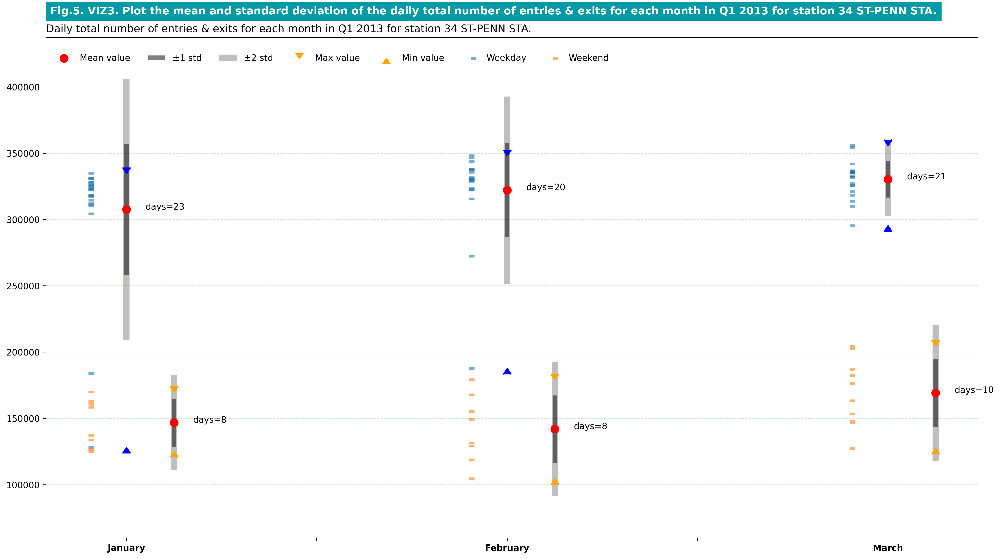

In [13]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(16, 9), dpi=350)

_ = visuals_prepared.plot_gradientplot_intervals(df_aux, fig, axes)

title = f'Fig.{img_num}. VIZ3. Plot the mean and standard deviation of the daily total number of entries \
& exits for each month in Q1 2013 for station 34 ST-PENN STA.'
fig.suptitle(t=title, x=0.053, y=0.98, **main_title_dict_style); img_num += 1
fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### VIZ4

* **Question**: - Plot _25/50/75 percentile_ of the daily total number of entries & exits for each month in Q1 2013 for station 34 ST-PENN STA.
* **Answer**: 
    * We see **charts illustrating statistics (quantiles) of the daily total number of entries & exits** (busyness) for each month in Q1 2013 for station 34 ST-PENN STA
        * **Distributions are bi-modal** (we mentioned weekly seasonality already), so, it would be better to calculate statistics for components instead of for a mixture

* **Notes / remarks**:
    1. We used a mix of **traditional boxplots** & **point-cloud** to show point estimations and distributions at the same time
        * for easily separating weekend/not weekend clusters
        * for general monthly looks
            * Left end shows 25-percentile (Q1), mid shows 50-percentile (Q2, median) value, right end shows, whiskers show an inter-quartile range (Range)
    1. To refresh how to read a boxplot see pictorial image from `matplotlib`'s documentation, [[here]](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.boxplot.html)

> ```
     Q1-1.5IQR   Q1   median  Q3   Q3+1.5IQR
                  |-----:-----|
  o      |--------|     :     |--------|    o  o
                  |-----:-----|
flier             <----------->            fliers
                       IQR
```

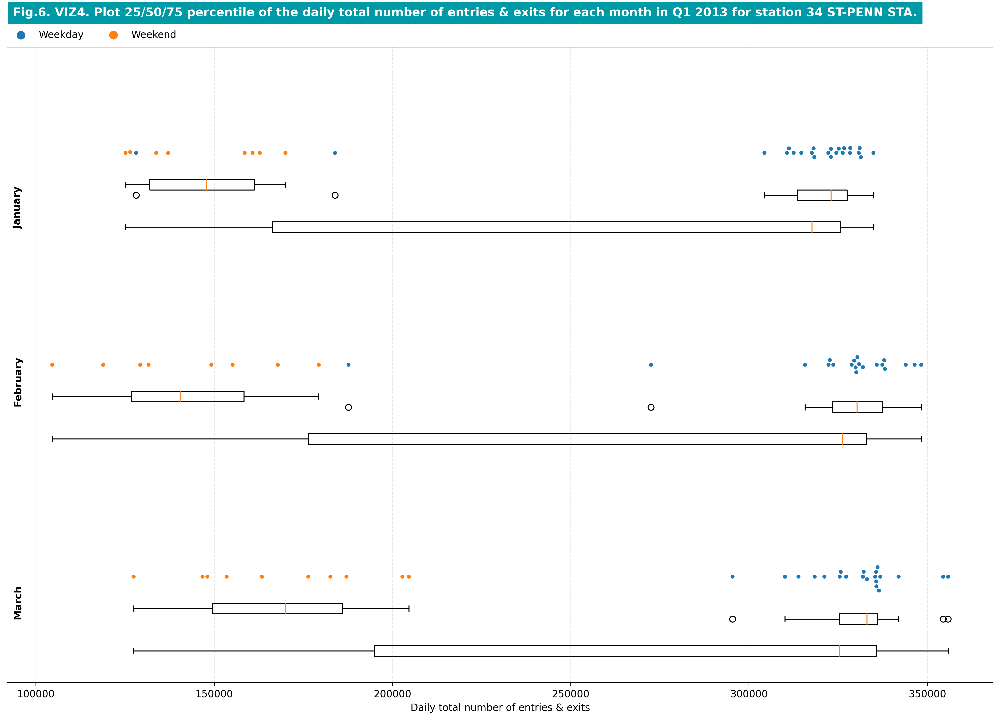

In [14]:
df_to_plot = df_aux.reset_index()[['AUDIT_MONTH', 'BUSYNESS', 'IS_WEEKEND']]
#df_to_plot.AUDIT_MONTH = df_to_plot.AUDIT_MONTH.astype('object')
dtf = [
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 1) & (df_to_plot.IS_WEEKEND)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 1) & (~df_to_plot.IS_WEEKEND)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 2) & (df_to_plot.IS_WEEKEND)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 2) & (~df_to_plot.IS_WEEKEND)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 3) & (df_to_plot.IS_WEEKEND)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 3) & (~df_to_plot.IS_WEEKEND)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 1)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 2)].BUSYNESS,
    df_to_plot[(df_to_plot['AUDIT_MONTH'] == 3)].BUSYNESS
]

fig, axes = plt.subplots(1, 1, figsize=(15, 10), dpi=350)

visuals_prepared.plot_boxplot_jitter_mix(df_jitter=df_to_plot, df_boxes=dtf, fig=fig, axis=axes)

title = f'Fig.{img_num}. VIZ4. Plot 25/50/75 percentile of the daily total number of entries \
& exits for each month in Q1 2013 for station 34 ST-PENN STA.'
fig.suptitle(t=title, x=0.07, y=1.01, **main_title_dict_style); img_num += 1
fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])
del dtf

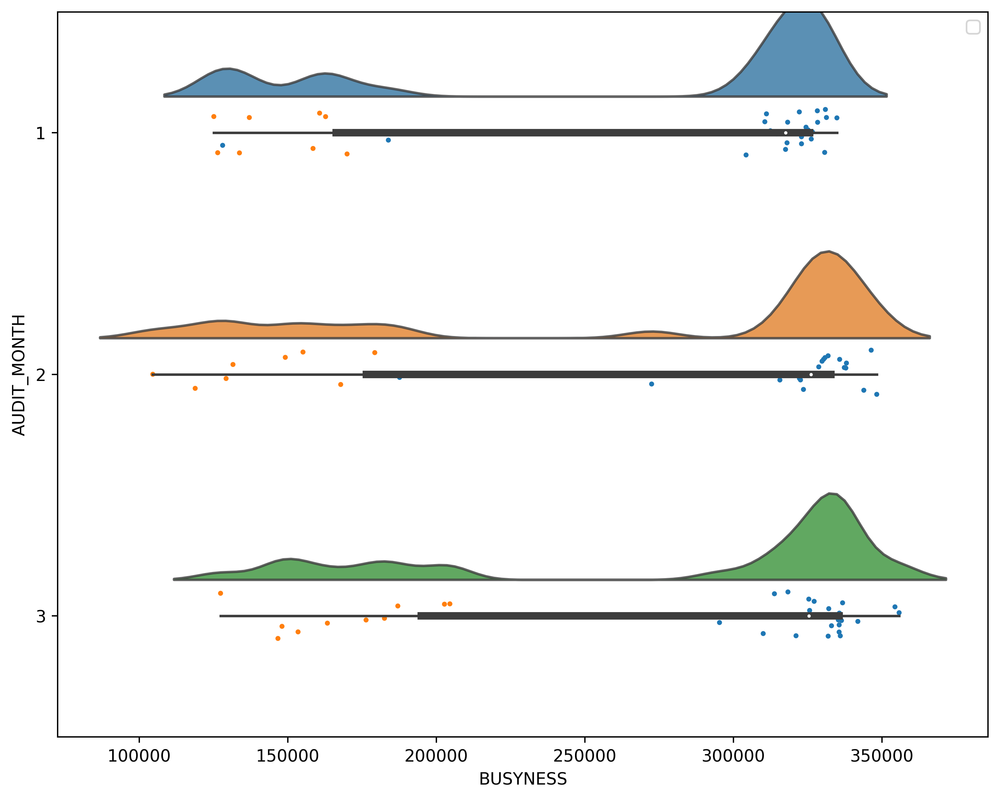

In [15]:
fig, ax = plt.subplots(figsize=(10, 8), dpi=350)
dy = "group"; dx="score"; ort="h"; pal = sns.color_palette(n_colors=2)

ax = pt.half_violinplot(x='BUSYNESS', y='AUDIT_MONTH',  
                        data=df_aux.reset_index()[['AUDIT_MONTH', 'BUSYNESS', 'IS_WEEKEND']],
                        orient='h', bw = .1, alpha=0.8)

ax = sns.stripplot(x='BUSYNESS', y='AUDIT_MONTH',  
                data=df_aux.reset_index()[['AUDIT_MONTH', 'BUSYNESS', 'IS_WEEKEND']],
                edgecolor="white", palette=pal,
                size=3, jitter=1, 
                zorder=0, orient=ort,
                hue='IS_WEEKEND')

plt.legend('')

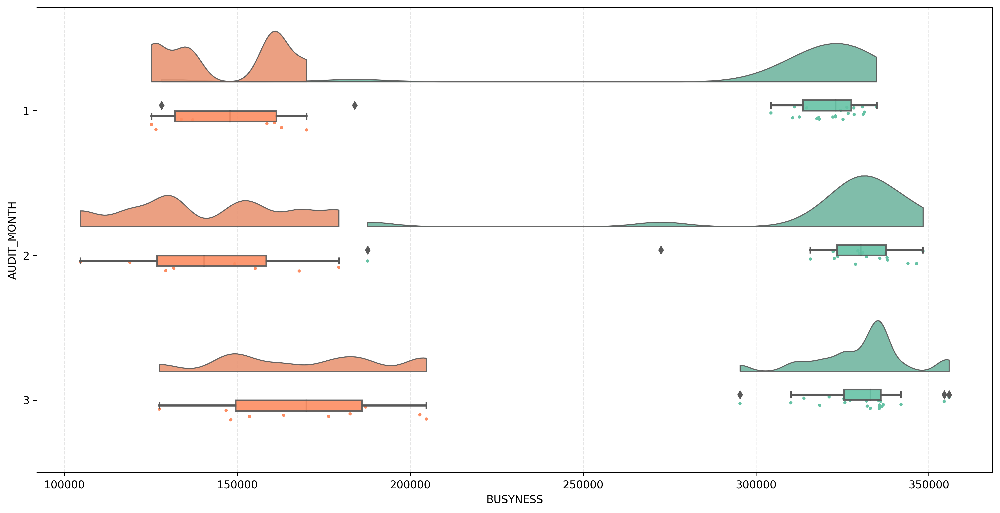

In [16]:
fig, ax = plt.subplots(figsize=(16, 8), dpi=350)

pt.RainCloud(y='BUSYNESS', x='AUDIT_MONTH', 
             data=df_aux.reset_index()[['AUDIT_MONTH', 'BUSYNESS', 'IS_WEEKEND']], 
             hue='IS_WEEKEND', 
             dodge = True, jitter=0.1, move=0.05, point_size=3, width_box=0.15,
             orient='h', alpha=0.9, point_c='gray',
             ax=ax, zorder=10)

ax.grid(axis='x', linestyle='--', alpha=0.2, color='gray', zorder=10)
ax.spines[['left']].set_visible(False)

ax.legend().remove()
#fig.legend()

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### DA4

* **Question**: - What stations have seen the most usage growth/decline in 2013?
* **Answer**: 
    * We see **top-10 stations that have seen the most usage growth/decline** in our data in Q1 2013, considering the next remarks
* **Notes / remarks**:
    1. Question is very **parameter (expert decision) dependent**, because there is no one-fits-all approach to calculate usage changes
        * how would we compare (rank) changes?
        * how do we smooth and aggregate changes?
        * do we account for significant growth/decline, absolute growth/decline, or 'just growth/decline'?
    1. **We defined** `growth/decline` as a `median weekly change, %` for the respective station
    1. Also, we found some **prior knowledge** on-line 
        * `AQUEDUCT TRACK` - was closed from 2011 to 2013 (closed and rebuilt to provide better access to the Resorts World Casino)
        * `BEACH 90 ST` been operated not normally about that time

In [17]:
df_aux = df.groupby(['Station', 'AUDIT_WEEK']).BUSYNESS.sum() # mean?

stations_reindex = df.groupby(['Station']).AUDIT_WEEK.nunique()\
[df.groupby(['Station']).AUDIT_WEEK.nunique() < 13]

# because I was to lazy to work with proper datetime resamplings
# & pd.reindex is not working well with multiindex from 2014 - see these workaround lines
for station in stations_reindex.index: 
    tmp_ = df_aux.loc[station].reindex(range(1, 14)).to_frame()
    tmp_['Station'] = station
    tmp_.set_index('Station', append=True, inplace=True)
    tmp_ = tmp_.reorder_levels(['Station', 'AUDIT_WEEK'])
    
    df_aux = df_aux.drop(level='Station', index=station)
    df_aux = pd.concat([df_aux, tmp_.squeeze(axis=1)])
    
del tmp_, stations_reindex
    #break

# may use different statistics - it's up to expert
stations_growth = df_aux.groupby(['Station']).pct_change(1).groupby(['Station']).median().nlargest(10)
stations_decline = df_aux.groupby(['Station']).pct_change(1).groupby(['Station']).median().nsmallest(10)

In [18]:
display(stations_growth); display(stations_decline)

Station
BEACH 90 ST        0.928571
KNICKERBOCKER      0.128446
METS-WILLETS PT    0.099306
RECTOR ST          0.082296
NEWARK HM HE       0.082094
116 ST-COLUMBIA    0.077033
MARBLE HILL-225    0.066684
238 ST             0.063883
5 AVE-59 ST        0.063231
AQUEDUCT-N CNDT    0.059434
Name: BUSYNESS, dtype: float64

Station
AQUEDUCT TRACK    -0.223121
BEACH 25 ST       -0.043850
215 ST            -0.042750
TWENTY THIRD ST   -0.042203
STEINWAY ST       -0.033593
121 ST            -0.030091
104 ST            -0.027837
77 ST             -0.027800
168 ST-BROADWAY   -0.025651
110 ST            -0.023826
Name: BUSYNESS, dtype: float64

> **_Subquestion 1:_** What stations have seen the most usage growth in 2013?

CPU times: user 518 ms, sys: 15.1 ms, total: 533 ms
Wall time: 530 ms


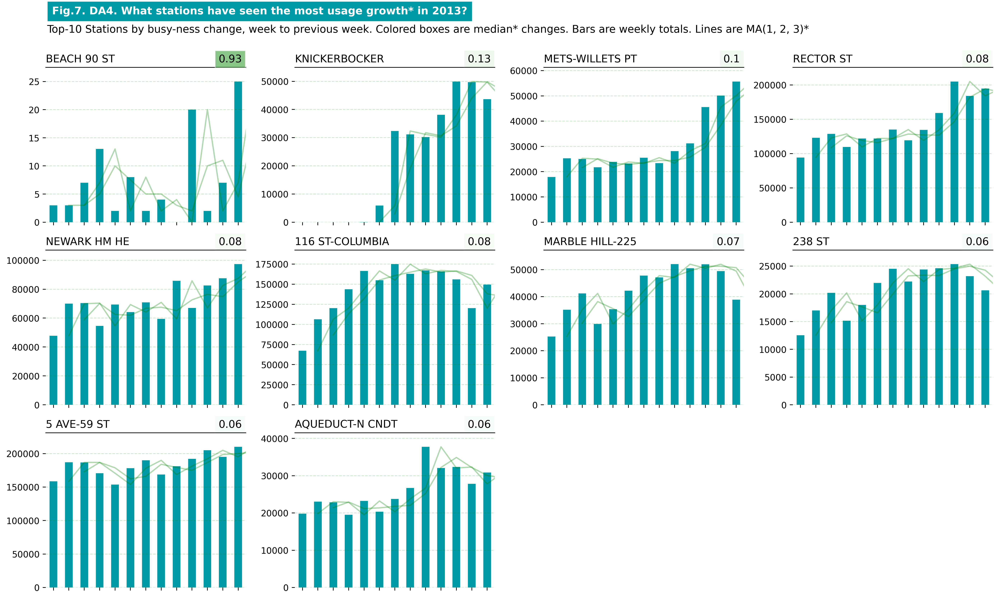

In [19]:
%%time
fig, axes = plt.subplots(4, 4, figsize=(16, 12), sharey=False, sharex=True, dpi=350)
axes = axes.flatten()

_ = visuals_prepared.plot_panel_bars_station_change(df_aux, stations_growth, fig, axes, 
                                                    plot_MA=True, plot_pct_change=False)

[axis.remove() for axis in axes[-6:]]

#handles, labels = plt.gca().get_legend_handles_labels()
#fig.legend(handles[:0:-1], labels[:0:-1], ncol=2, frameon=False, loc='upper right', bbox_to_anchor=[0.96, 1.025])
fig_sub_caption = '''Top-10 Stations by busy-ness change, week to previous week. \
Colored boxes are median* changes. Bars are weekly totals. Lines are MA(1, 2, 3)*'''
fig.text(x=0.05, y=0.99, s=fig_sub_caption, fontsize=12)
title = f"""Fig.{img_num}. DA4. What stations have seen the most usage growth* in 2013?"""; img_num += 1
fig.suptitle(title, **main_title_dict_style, x=0.055, y=1.025)
fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])

> **_Subquestion 2:_** What stations have seen the most usage decline in 2013?

CPU times: user 515 ms, sys: 13 ms, total: 528 ms
Wall time: 526 ms


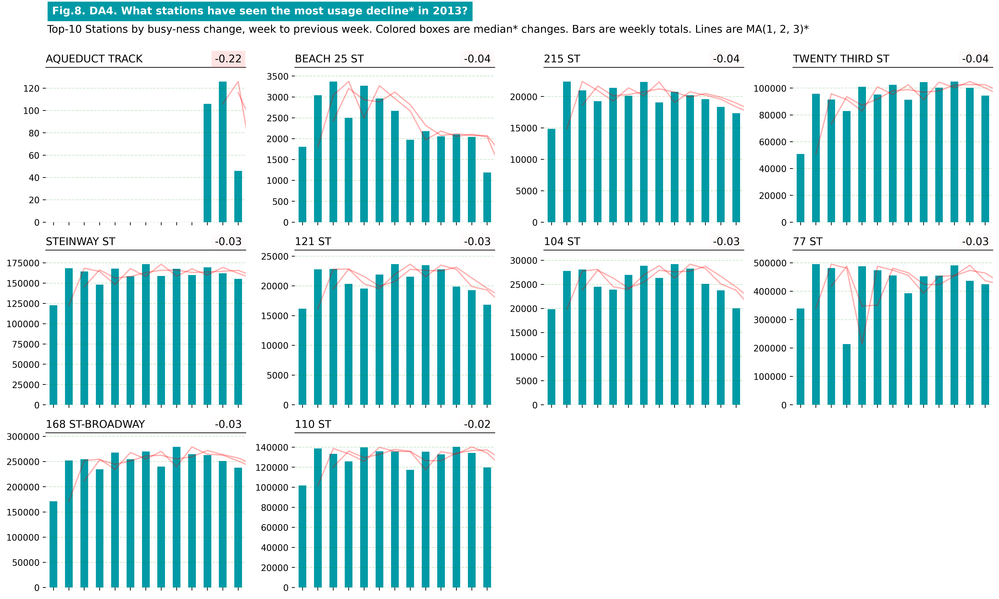

In [20]:
%%time
fig, axes = plt.subplots(4, 4, figsize=(16, 12), sharey=False, sharex=True, dpi=350)
axes = axes.flatten()

_ = visuals_prepared.plot_panel_bars_station_change(df_aux, stations_decline, fig, axes, 
                                                    plot_MA=True, plot_pct_change=False)

[axis.remove() for axis in axes[-6:]]

fig_sub_caption = '''Top-10 Stations by busy-ness change, week to previous week. \
Colored boxes are median* changes. Bars are weekly totals. Lines are MA(1, 2, 3)*'''
fig.text(x=0.05, y=0.99, s=fig_sub_caption, fontsize=12)
title = f"""Fig.{img_num}. DA4. What stations have seen the most usage decline* in 2013?"""; img_num += 1
fig.suptitle(title, **main_title_dict_style, x=0.055, y=1.025)
fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### DA5

* **Question**: - What dates are the least busy? Could you identify days on which stations were not operating at full capacity or closed entirely?
* **Answer**: 
    1. What dates are `the least busy`?
        * **Saturdays and Sundays** are the least busy days
            * **Sundays are less busy than Saturdays** 
        * **01-01-13 (US National Holiday)** and **02-09-13 (Saturday)** were the least busy in our period
    1. Could you identify days on which stations were `not operating at full capacity or closed entirely`?
        * **2013-01-01**, **2013-02-09**, **2013-01-27**, **2013-02-03**, **2013-01-13**
* **Notes / remarks**:
    1. To define `the least busy`, we used a quantile approach - dates with **less than 25% of busy-ness**
    1. To define `not operating at full capacity or closed entirely`, we used the percentile approach - with **less than 5% of busy-ness**
        * Going deeper, we might different methods
            * **advanced time serier outlier (anomaly) detection** and **intervention analysis** ([link](https://github.com/rob-med/awesome-TS-anomaly-detection))
            * **expert knowledge** (i.e. we know about `AQUEDUCT TRACK`, `BEACH 90 ST`)
            * **mix of expert knowledge and mathematical methods** (enrich statistical heuristics with subway from news or reports)

> **_Subquestion 1:_** What dates are the least busy? 

In [21]:
percentile = 0.25

df_aux = df.groupby(['DATE', 'AUDIT_DOW']).BUSYNESS.sum()
df_aux[df_aux <= df_aux.quantile(percentile)]

DATE      AUDIT_DOW
01-01-13  1            3793555.0
01-05-13  5            5874946.0
01-06-13  6            4546820.0
01-12-13  5            5899819.0
01-13-13  6            4552109.0
01-19-13  5            5909318.0
01-20-13  6            4721267.0
01-21-13  0            5936202.0
01-26-13  5            5703008.0
01-27-13  6            4514139.0
02-02-13  5            5960389.0
02-03-13  6            4435365.0
02-09-13  5            4297023.0
02-10-13  6            4641604.0
02-17-13  6            4920645.0
02-18-13  0            5906303.0
02-23-13  5            5752148.0
02-24-13  6            4647381.0
03-03-13  6            4915281.0
03-10-13  6            4732709.0
03-17-13  6            5125814.0
03-24-13  6            5115521.0
03-31-13  6            4882730.0
Name: BUSYNESS, dtype: float64

> **_Subquestion 2:_** Could you identify days on which stations were not operating at full capacity or closed entirely?

In [22]:
percentile = 0.05

df_stationwise_aggregation = df.groupby(['Station', 'Line Name', 'Division', 'DATE']).BUSYNESS.sum().reset_index(level=[1])
df_stationwise_quantile = df.groupby(['Station', 'Line Name', 'Division', 'DATE']).BUSYNESS.sum().groupby(['Station']).quantile(percentile)
df_aux = df_stationwise_aggregation.join(df_stationwise_quantile.to_frame(), rsuffix='_target_percentile')
df_aux = df_aux.reset_index()

df_aux['DATE'] = pd.to_datetime(df_aux['DATE'])

del df_stationwise_aggregation, df_stationwise_quantile

In [23]:
df_aux[df_aux.BUSYNESS <= df_aux.BUSYNESS_target_percentile].DATE.value_counts().nlargest(5)

2013-01-01    323
2013-02-09    249
2013-02-03    210
2013-01-27    182
2013-03-10    160
Name: DATE, dtype: int64

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### VIZ5

* **Question**: - Plot the daily number of closed stations and number of stations that were not operating at full capacity in Q1 2013.
* **Answer**: 
    * Most of the stations in our data **were not operating at full or closed capacity during weekends**, specifically Sundays
        * **Top-5 longest closed stations** in our data - 161 ST-YANKEE, 64 days; BEACH 90 ST, 53 days; WALL ST, 23 days; MORRISON AVE, 10 days; AQUEDUCT TRACK, 6 days
    * We allow that **methodology** we used to `closed and/or not operating at full capacity **may require additional domain-expert knowledge** and data research
* **Notes / remarks**:
    1. To define `not operating at full capacity or closed entirely`, we used the percentile approach - with **less than 5% of busy-ness for that station**
    1. To define `closed entirely`, we used heuristics - with **busy-ness equals to 0 (zero)**
    
    1. Sometimes "calendar heatmap" (see: [link](http://bl.ocks.org/ajschumacher/5127001) or [link](https://stackoverflow.com/questions/32485907/matplotlib-and-numpy-create-a-calendar-heatmap)) is more interesting and less complex to read comparing to bar charts for this type of question

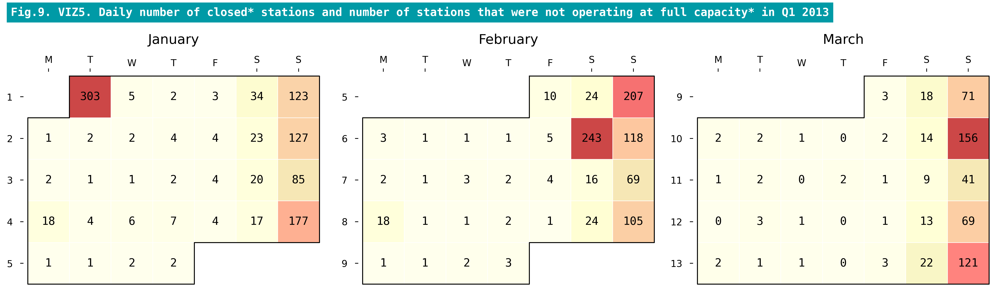

In [24]:
df_plot = df_aux[df_aux.BUSYNESS <= df_aux.BUSYNESS_target_percentile]
df_plot = df_plot.groupby('DATE').Station.nunique().rename('Number of stations')

title = f"""Fig.{img_num}. VIZ5. Daily number of closed* stations and number of stations \
that were not operating at full capacity* in Q1 2013"""; img_num += 1

_ = visuals_prepared.plot_heatmap_calendar(df_plot, title, main_title_dict_style);
del df_plot

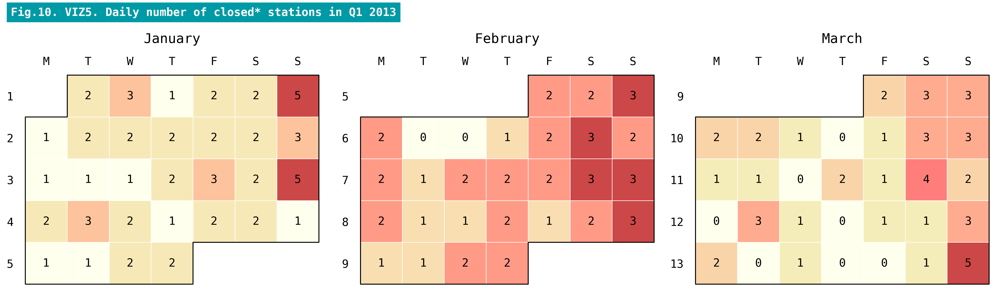

In [25]:
df_plot = df_aux[df_aux.BUSYNESS == 0]
df_plot = df_plot.groupby('DATE').Station.nunique().rename('Number of stations')

title = f'Fig.{img_num}. VIZ5. Daily number of closed* stations in Q1 2013'; img_num += 1

_ = visuals_prepared.plot_heatmap_calendar(df_plot, title, main_title_dict_style);
del df_plot
# df_aux[df_aux.BUSYNESS == 0].Station.value_counts()

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

### DA6

* **Question**: - Bonus: What hour is the busiest for station CANAL ST in Q1 2013?
* **Answer**: 
    * The **busiest hour** for the station is **18:00 (6PM)**, under stated conditions and methodology 
        * There is **growth from 16:00 (4PM) to 18:00 (6PM) on weekdays** - COB rush
        * Usage pattern on **weekends is a bit different** - less busy overall, no COB peak, usage started its' morning growth later
* **Notes / remarks**:
    1. To "estimate" `busiest hour ` we used circular $lags@\{0, -1, -2, -3, +1 \text{ hours}\}$ (to handle audit occurrences, because we didn't resample dataset) and took mean of lags (to "smooth" the series)
        1. On the other hand, as said above, we might interpolate (resample) available series into hourly granularity, see open-sourced package by [[Two Sigma Data Clinic - MTA]](https://github.com/tsdataclinic/mta)
    1. We provided "ordinal" and polar (circular) views. 
        * The circular representation allows a person to read the cyclic nature of time (23PM is closer to 2AM) better. An example is [[Analyze the NYC Taxi Data by Chih-Ling Hsu - 2. Observe The Difference in Temporal Attributes]](https://chih-ling-hsu.github.io/2018/05/14/NYC#2-observe-the-difference-in-temporal-attributes)
        * The "ordinal" (plain) representation is easier to read overall
            * Also, it might work to show growth ratios between bars [[Growth Bar Chart]](https://vizzlo.com/create/growth-bar-chart))

> **Bar plot view**

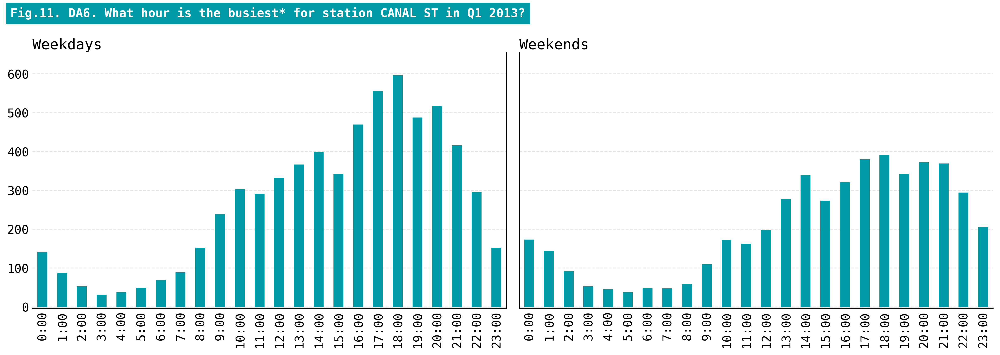

In [26]:
days_of_week = {"Weekdays": [0, 1, 2, 3, 4], "Weekends": [5, 6]}
lags = [-1, -2, -3, 1]

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True, dpi=350)
axes = axes.flatten()
# Plots hourly `busyness metric` (of subway usage) in ordinal barplot.
for indx, (title, days_of_week) in enumerate(days_of_week.items()):

    df_aux = pd.Series(pd.RangeIndex(0, 24), name='BUSYNESS') 
    df_aux += df[(df['Station'] == 'CANAL ST') 
                 & (df.AUDIT_DOW.isin(days_of_week)) #& (df.DESC == "REGULAR") 
                 ].groupby(['AUDIT_HOUR']).BUSYNESS.mean()
    df_aux = df_aux.to_frame()
    for lag in lags:
        df_aux[f'lag_{lag}'] = np.roll(df_aux.BUSYNESS, lag)
        
    df_aux.mean(axis=1).plot.bar(ax=axes[indx], color='#009aa6', zorder=10, label='Hourly mean bar chart')
    
    # Beautify
    axes[indx].margins(y=0.1, tight=False); axes[indx].set_ylim(ymin=-3)
    axes[indx].grid(axis='y', alpha=0.2, c='gray', linestyle='--', zorder=0)
    ticks = ["{}:00".format(x) for x in range(24)]
    axes[indx].set_xticklabels(ticks)
    axes[indx].set_title(title, loc='left', pad=-0.05)
    if indx % 2 == 0: axes[indx].spines[['top', 'left']].set_visible(False)
    else: axes[indx].spines[['top', 'right']].set_visible(False)
        
title = f'Fig.{img_num}. DA6. What hour is the busiest* for station CANAL ST in Q1 2013?'
fig.suptitle(t=title, x=0.016, y=0.98, **main_title_dict_style); img_num += 1
fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])

> **Polar bar plot view**

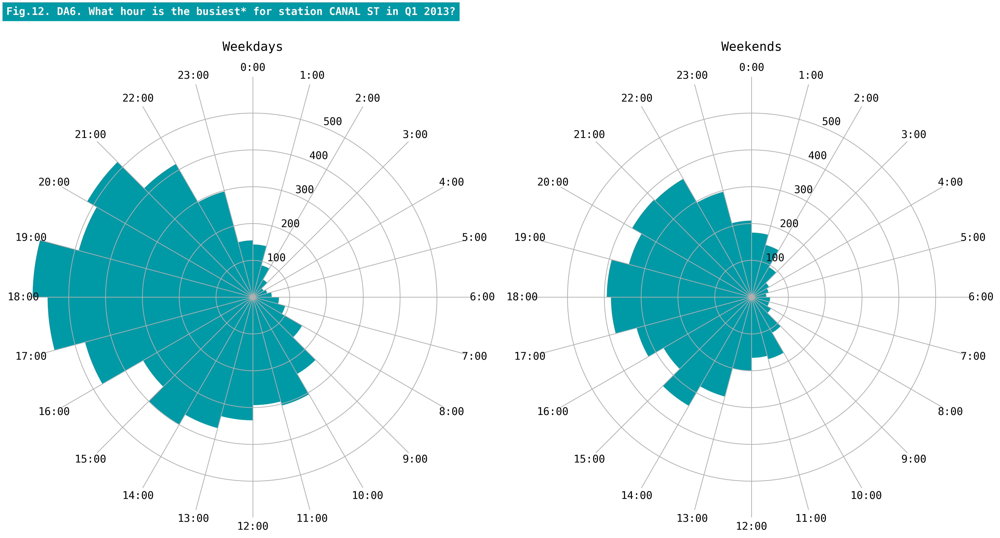

In [27]:
days_of_week = {"Weekdays": [0, 1, 2, 3, 4], "Weekends": [5, 6]}
lags = [-1, -2, -3, 1]

fig, axes = plt.subplots(1, 2, figsize=(16, 12), sharey=True,
                         subplot_kw={'projection': "polar"}, dpi=350)

for indx, (title, days_of_week) in enumerate(days_of_week.items()):

    df_aux = pd.Series(pd.RangeIndex(0, 24), name='BUSYNESS') 
    df_aux += df[(df['Station'] == 'CANAL ST') & (df.AUDIT_DOW.isin(days_of_week))].\
                                                groupby(['AUDIT_HOUR']).BUSYNESS.mean()
    df_aux = df_aux.to_frame()
    for lag in lags:
        df_aux[f'lag_{lag}'] = np.roll(df_aux.BUSYNESS, lag)
    
    _ = visuals_prepared.plot_clock_metric_hourly(df_aux.mean(axis=1), "#009aa6", title, axes[indx])
    
    #axes[indx].margins(y=0.1, tight=False)
    axes[indx].yaxis.set_tick_params(labelbottom=True)
    axes[indx].spines['polar'].set_visible(False)

title = f'Fig.{img_num}. DA6. What hour is the busiest* for station CANAL ST in Q1 2013?'
fig.suptitle(t=title, x=0.01, y=0.87, **main_title_dict_style); img_num += 1
fig.tight_layout(rect=[0.0, 0.0, 1.0, 1.0])

[To table of contents](#Table-of-contents) | [To list of questions](#Data-Analysis-and-Visualization)
***

<img src="../figures/external/venn-triangles-back.png"
     alt="Venn Triangles placeholder"
     style="width: 100%; height: 100px;"/>